<a href="https://colab.research.google.com/github/Sushilbhatta09/Html-code-generator/blob/main/Model_final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

In [2]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 25

In [ ]:
!unzip project_data.zip

In [26]:
class_names=['Button','Carousel','Check Box','Form','Heading','Image','Label','Link','Pagination','Paragraph','Password box','Radio Button','Select','Subheading','Table','Table data','Table head','Table row','Textarea','Textbox']
print(len(class_names))
colors = np.random.uniform(0, 255, size=(len(class_names), 3))
print(colors[0])

19
[ 13.1788389  135.49543105 137.86195601]


In [5]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [6]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [11]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()
    
    num_images = len(all_training_images)
    
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                bbox_list= bbox_string.split(' ')
                if len(bbox_list)==5 :
                  del bbox_list[0]
                x_c, y_c, w, h = bbox_list
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

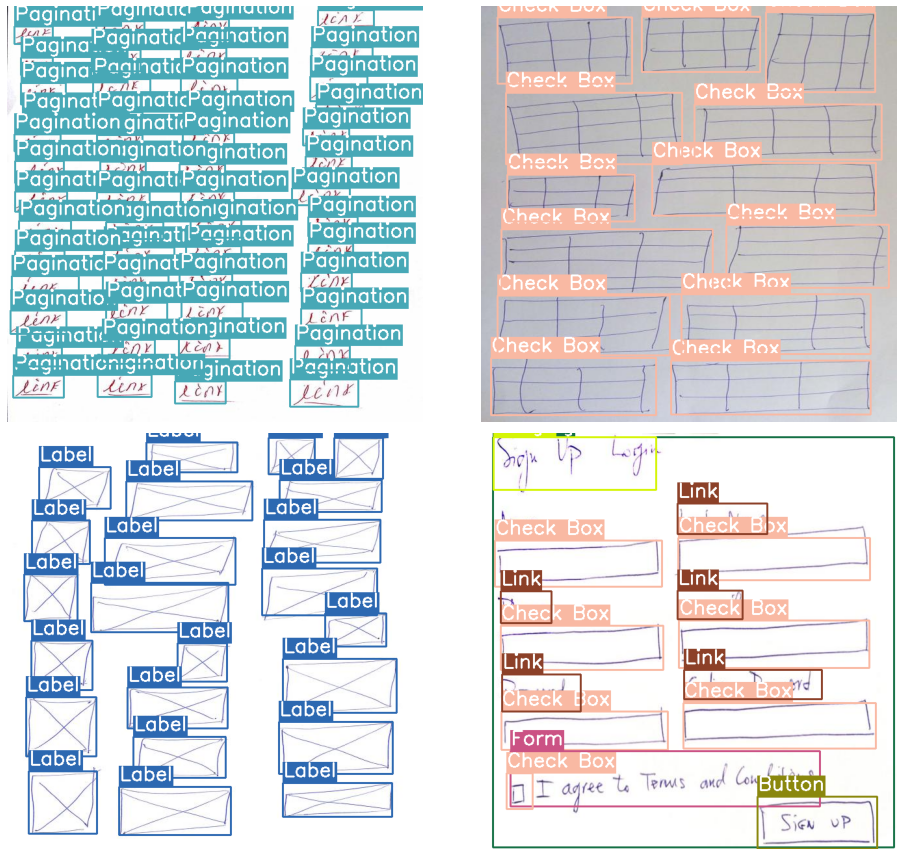

In [35]:
# Visualize a few training images.
plot(
    image_paths='test/images/*', 
    label_paths='test/labels/*',
    num_samples=4,
)

In [32]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="gOCWNtgakwRZrR01nSWg")
project = rf.workspace("sketch2code-huuvc").project("sketch2code-3pzxe")
dataset = project.version(7).download("yolov8")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=691df46a95c67a6ea478ba9115d062d525e642bc8c290ee905e79a7466049a74
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: cycler
    Found existing installation: cycler 0.11.0
    Uninstalling cycler-0.11.0:
      Successfully uninstalled cycler-0.11.0


loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics<=8.0.20`, to intall it `pip install ultralytics<=8.0.20`.

Extracting Dataset Version Zip to sketch2code-7 in yolov8:: 100%|██████████| 2252/2252 [00:01<00:00, 1897.53it/s]


In [49]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR
RES_DIR = set_res_dir()
print(RES_DIR)

Current number of result directories: 1
results_2
results_2


In [54]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

In [38]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 15287, done.
remote: Total 15287 (delta 0), reused 0 (delta 0), pack-reused 15287
Receiving objects: 100% (15287/15287), 14.12 MiB | 28.46 MiB/s, done.
Resolving deltas: 100% (10490/10490), done.


In [39]:
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [ ]:
!pip install -r requirements.txt

In [53]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10364), started 0:35:23 ago. (Use '!kill 10364' to kill it.)

<IPython.core.display.Javascript object>

In [43]:
!pwd

/content/yolov5


In [52]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data /content/yolov5/sketch2code-7/data.yaml  --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 4
results_5
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/sketch2code-7/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_5, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-116-g5c91dae Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, ob

In [56]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [57]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png				     results.png
events.out.tfevents.1678096412.53dbde3e3452.14955.0  train_batch0.jpg
F1_curve.png					     train_batch1.jpg
hyp.yaml					     train_batch2.jpg
labels_correlogram.jpg				     val_batch0_labels.jpg
labels.jpg					     val_batch0_pred.jpg
opt.yaml					     val_batch1_labels.jpg
P_curve.png					     val_batch1_pred.jpg
PR_curve.png					     val_batch2_labels.jpg
R_curve.png					     val_batch2_pred.jpg
results.csv					     weights
['runs/train/results_5/val_batch1_pred.jpg', 'runs/train/results_5/val_batch2_pred.jpg', 'runs/train/results_5/val_batch0_pred.jpg']


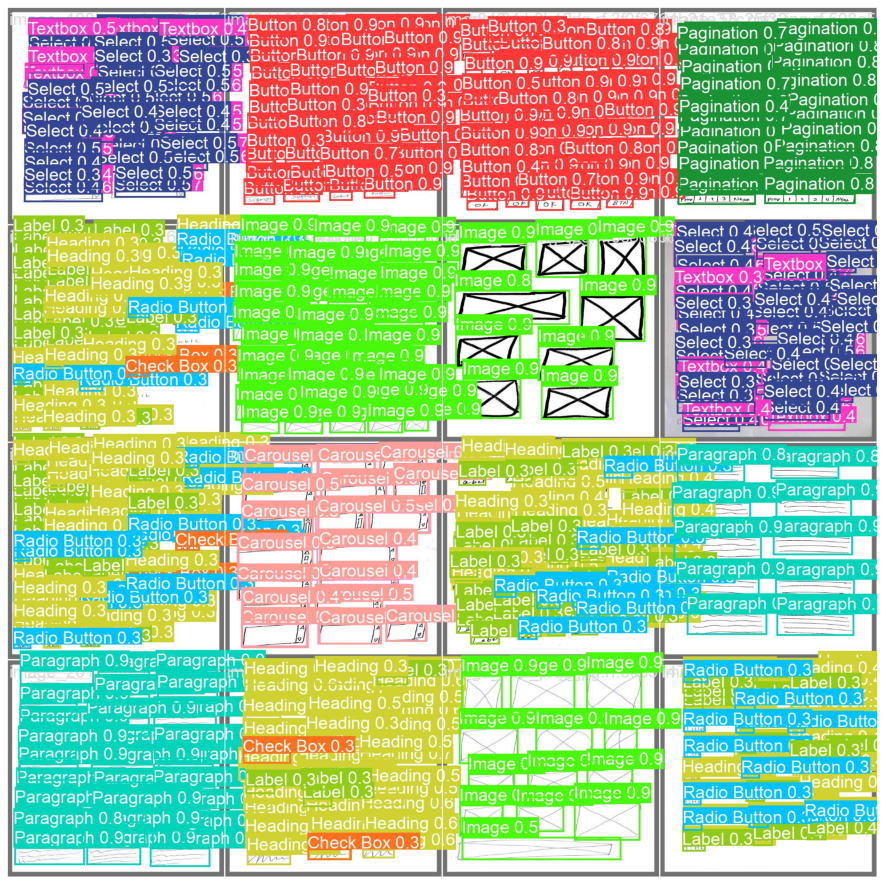

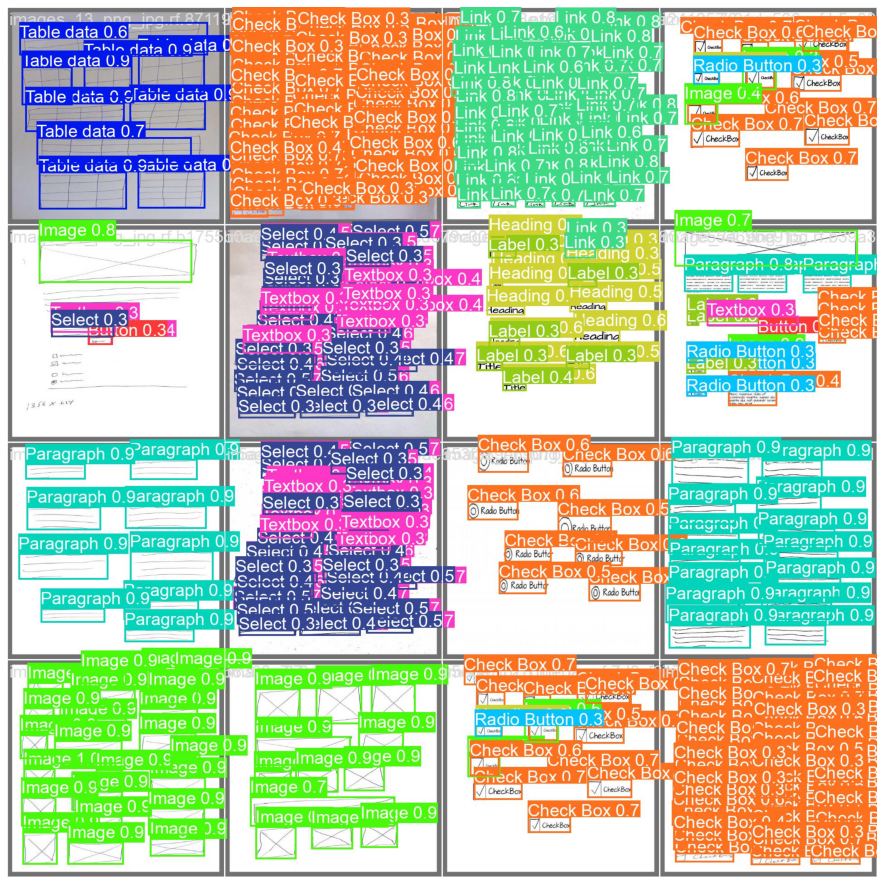

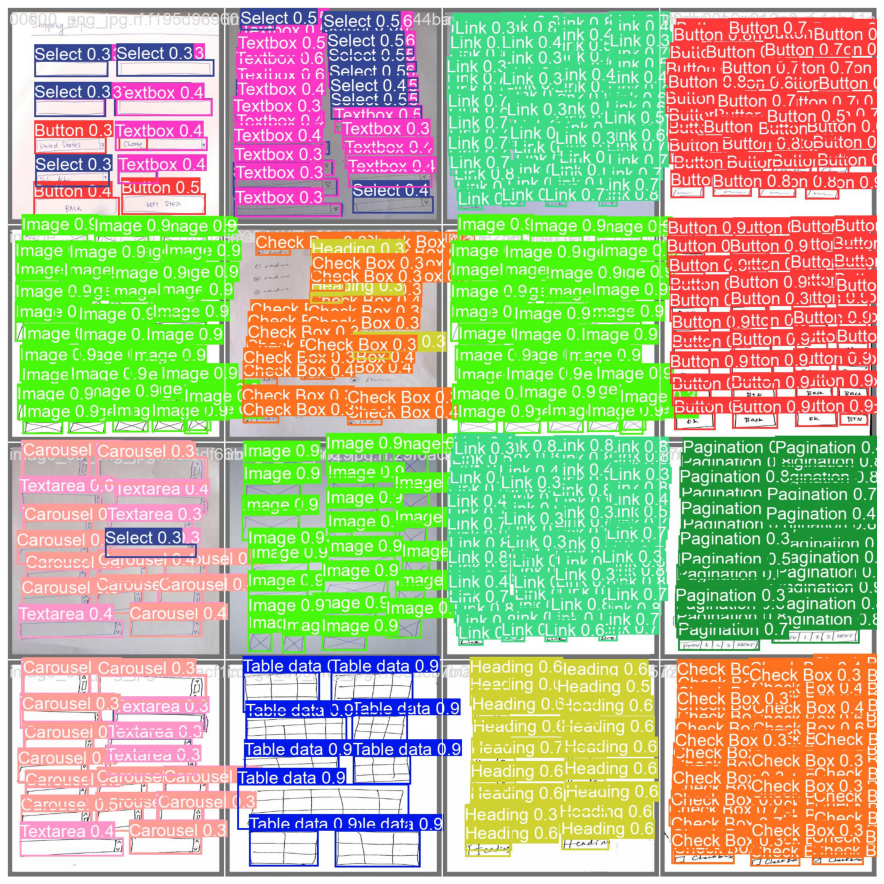

In [58]:
show_valid_results(RES_DIR)

In [80]:

!python detect.py --weights /content/yolov5/runs/train/results_5/weights/best.pt --img 640 --conf 0.25 --source /content/yolov5/runs/train/images/1.jpg --save-txt


detect: weights=['/content/yolov5/runs/train/results_5/weights/best.pt'], source=/content/yolov5/runs/train/images/1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-116-g5c91dae Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /content/yolov5/runs/train/images/1.jpg: 640x640 3 Buttons, 7 Selects, 5 Textboxs, 12.7ms
Speed: 0.6ms pre-process, 12.7ms inference, 2.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2
1 labels saved to runs/detect/exp2/labels


In [60]:
import torch

model = torch.load('/content/yolov5/runs/train/results_5/weights/best.pt', map_location=torch.device('cpu'))['model'].float()


In [77]:
#from yolov5.utils.general import plot_one_box
import torchvision.transforms as transforms
from yolov5.models.experimental import attempt_load
from torch.utils.data import DataLoader
from torchvision import datasets
from PIL import Image

# Load the trained YOLOv5 model
model = attempt_load('/content/yolov5/runs/train/results_5/weights/best.pt')

# Load a single image to predict on
image = Image.open('/content/test/images/100.jpg')

transform = transforms.Compose([
    transforms.Resize((640, 640)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Apply the transformation to the image to get a tensor
tensor = transform(image)
print(tensor)

# Make predictions on the image
results = model([tensor])




Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs


tensor([[[2.24891, 2.24891, 2.24891,  ..., 2.24891, 2.24891, 2.24891],
         [2.24891, 2.24891, 2.24891,  ..., 2.24891, 2.24891, 2.24891],
         [2.24891, 2.24891, 2.24891,  ..., 2.24891, 2.24891, 2.24891],
         ...,
         [2.24891, 2.24891, 2.24891,  ..., 2.24891, 2.24891, 2.24891],
         [2.24891, 2.24891, 2.24891,  ..., 2.24891, 2.24891, 2.24891],
         [2.24891, 2.24891, 2.24891,  ..., 2.24891, 2.24891, 2.24891]],

        [[2.42857, 2.42857, 2.42857,  ..., 2.42857, 2.42857, 2.42857],
         [2.42857, 2.42857, 2.42857,  ..., 2.42857, 2.42857, 2.42857],
         [2.42857, 2.42857, 2.42857,  ..., 2.42857, 2.42857, 2.42857],
         ...,
         [2.42857, 2.42857, 2.42857,  ..., 2.42857, 2.42857, 2.42857],
         [2.42857, 2.42857, 2.42857,  ..., 2.42857, 2.42857, 2.42857],
         [2.42857, 2.42857, 2.42857,  ..., 2.42857, 2.42857, 2.42857]],

        [[2.64000, 2.64000, 2.64000,  ..., 2.64000, 2.64000, 2.64000],
         [2.64000, 2.64000, 2.64000,  ..., 2.

TypeError: ignored